In [1]:
import pyarrow.parquet as pq

filename = "logos.snappy.parquet" 
df = pq.read_table(filename).to_pandas()
print(df)

                                     domain
0                         stanbicbank.co.zw
1                            astrazeneca.ua
2               autosecuritas-ct-seysses.fr
3                                    ovb.ro
4     mazda-autohaus-hellwig-hoyerswerda.de
...                                     ...
4379                              synlab.ec
4380                            ccusa.co.za
4381               aamcolawrencevillega.com
4382     mazda-autohaus-born-ludwigslust.de
4383                     savethechildren.ca

[4384 rows x 1 columns]


In [2]:
import requests
import requests

# Function to fetch favicon from Google
def fetch_favicon_from_google(domain):
    url = f"https://www.google.com/s2/favicons?domain={domain}"
    try:
        response = requests.get(url, stream=True, timeout=5)
        if response.status_code == 200:
            return response.content  # Return image bytes
    except requests.exceptions.RequestException as e:
        print(f"Error fetching favicon for {domain} via Google API: {e}")
    return None  # Return None if any error occurs

# Main function to fetch favicon with fallback
def fetch_favicon(domain):
    # Attempt to fetch favicon from the domain
    url = f"https://{domain}/favicon.ico"
    try:
        response = requests.get(url, stream=True, timeout=5)
        if response.status_code == 200:
            return response.content  # Return image bytes
    except requests.exceptions.RequestException as e:
        print(f"Error fetching favicon for {domain}: {e}")  # Log the error

    # Fallback to fetch favicon from Google's service
    return fetch_favicon_from_google(domain)

# Function to fetch logo from Clearbit with error handling
def fetch_logo(domain):
    url = f"https://logo.clearbit.com/{domain}"
    try:
        response = requests.get(url, stream=True, timeout=5)
        if response.status_code == 200:
            return response.content  # Return image bytes
    except requests.exceptions.RequestException as e:
        print(f"Error fetching logo for {domain}: {e}")  # Log the error
    return None

In [3]:
from bs4 import BeautifulSoup
from urllib.parse import urljoin

# Counters for statistics
logo_count = 0
favicon_count = 0
scraped_logo_count = 0
not_found_count = 0

import requests
from bs4 import BeautifulSoup
from urllib.parse import urljoin
import imghdr

def is_valid_image(image_bytes):
    return imghdr.what(None, h=image_bytes) or image_bytes.strip().startswith(b"<?xml")  # Allow SVGs

def download_image(url):
    try:
        response = requests.get(url, stream=True, timeout=5)
        if response.status_code == 200 and (
            "image" in response.headers.get("Content-Type", "") or 
            "svg" in response.headers.get("Content-Type", "")
        ):
            return response.content
    except requests.exceptions.RequestException as e:
        print(f"Error downloading image from {url}: {e}")
    return None

def scrape_logo(domain):
    url = f"https://{domain}"
    headers = {
        "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/110.0.0.0 Safari/537.36"
    }
    
    try:
        response = requests.get(url, headers=headers, timeout=2, allow_redirects=True)
        if response.status_code != 200:
            return None

        soup = BeautifulSoup(response.text, "html.parser")
        icon_formats = ['favicon.ico', 'favicon.png', 'favicon.svg', 'apple-touch-icon', 'icon', 'logo']

        # Look for <link> tags
        for tag in soup.find_all("link", href=True):
            href = tag["href"]
            rel = tag.get("rel", [])
            if any(fmt in href or fmt in rel for fmt in icon_formats):
                if href.endswith((".png", ".jpg", ".jpeg", ".svg", ".ico")):
                    logo_url = urljoin(url, href)
                    image = download_image(logo_url)
                    if image and is_valid_image(image):
                        return image
            
        # Look for <img> tags
        for img_tag in soup.find_all("img"):
            img_src = img_tag.get("src") or img_tag.get("data-src")
            if img_src and img_src.lower().endswith((".png", ".jpg", ".jpeg", ".svg")):
                if "logo" in img_src.lower():
                    logo_url = urljoin(url, img_src)
                    image = download_image(logo_url)
                    if image and is_valid_image(image):
                        return image

    except requests.exceptions.RequestException as e:
        print(f"Error scraping logo for {domain}: {e}")
    return None


def download_image(url):
    """Helper function to download an image and return its content."""
    try:
        img_response = requests.get(url, stream=True, timeout=5)
        if img_response.status_code == 200:
            return img_response.content  # Return image bytes
    except requests.exceptions.RequestException as e:
        print(f"Error downloading image from {url}: {e}")
    return None

In [ ]:
# Dictionary to store images in memory
logos_dict = {}

# Process each domain
for domain in df['domain']:
    logo = fetch_logo(domain)
    if logo:
        logos_dict[domain] = logo
        logo_count += 1
    else:
        favicon = fetch_favicon(domain)
        if favicon:
            logos_dict[domain] = favicon
            favicon_count += 1
        else:
            scraped_logo = scrape_logo(domain)
            if scraped_logo:
                logos_dict[domain] = scraped_logo
                scraped_logo_count += 1
            else:
                logos_dict[domain] = None
                not_found_count += 1
                print("NOT FOUND FOR: " + domain)

# Print statistics
print(f"Logos from Clearbit: {logo_count}")
print(f"Favicons found: {favicon_count}")
print(f"Logos scraped from webpage: {scraped_logo_count}")
print(f"Not found: {not_found_count}")

Error fetching favicon for zalando.cz: HTTPSConnectionPool(host='www.zalando.cz', port=443): Read timed out. (read timeout=5)
Error fetching favicon for xella-colloquium.berlin: HTTPSConnectionPool(host='xella-colloquium.berlin', port=443): Max retries exceeded with url: /favicon.ico (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x0000025967FB62C0>: Failed to resolve 'xella-colloquium.berlin' ([Errno 11001] getaddrinfo failed)"))
NOT FOUND FOR: axabreakdown.co.uk
Error fetching favicon for chicco.pl: HTTPSConnectionPool(host='chicco.pl', port=443): Max retries exceeded with url: /favicon.ico (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1007)')))
Error scraping logo for chicco.pl: HTTPSConnectionPool(host='chicco.pl', port=443): Max retries exceeded with url: / (Caused by SSLError(SSLError(1, '[SSL: SSLV3_ALERT_HANDSHAKE_FAILURE] sslv3 alert handshake failure (_ssl.c:1007)')))
NOT FOUND FOR: c

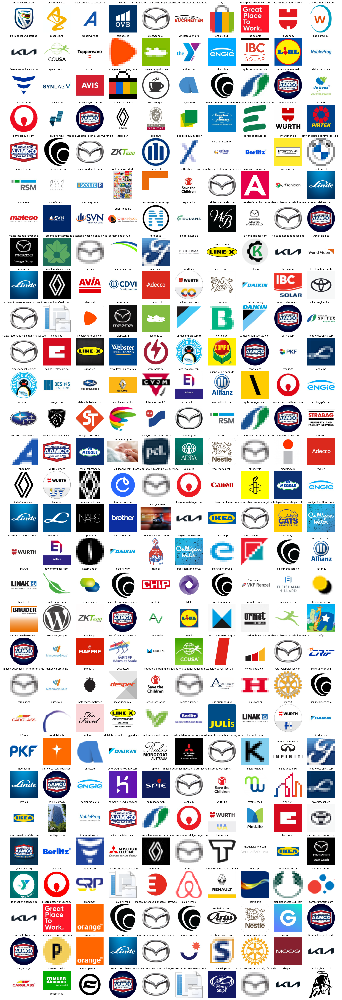

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import base64
import cairosvg
import os

# Define how many logos per row and how many rows
logos_per_row = 10
rows = 30

# Create a list of images to show and their corresponding domains
images_to_show = []
domain_names = []

# Add the MSYS2 path to the DLL search directories
os.add_dll_directory(r"C:\msys64\ucrt64\bin")

def process_image(image_data, domain):
    try:
        # Attempt to decode Base64
        try:
            decoded_data = base64.b64decode(image_data)
            if decoded_data.strip().startswith(b"<?xml"):  # Check if it's an SVG
                # Convert SVG to PNG using cairosvg
                png_data = cairosvg.svg2png(bytestring=decoded_data, dpi=300)  # Increase DPI for sharper output
                img = Image.open(BytesIO(png_data))
            else:
                # Handle binary image formats (e.g., PNG, JPEG)
                img = Image.open(BytesIO(decoded_data))
        except Exception:
            # If decoding fails, treat as raw binary
            img = Image.open(BytesIO(image_data))

        # Only resize if image dimensions exceed fixed_size
        if img.size[0] > fixed_size[0] or img.size[1] > fixed_size[1]:
            img.thumbnail(fixed_size)  # Resize while maintaining aspect ratio

        images_to_show.append(img)
        domain_names.append(domain)

    except Exception:
        pass


# Loop through domains and their images
for domain in df['domain'][:4000]:  
    image_data = logos_dict.get(domain, None)
    
    if image_data:
        # Check image format before opening
        process_image(image_data, domain)

# Create the plot
fixed_size = (400, 400)  # Increase size for thumbnails

# Create the plot with adjusted figure size
# Add `dpi` to the figure creation for high-quality rendering
fig, axes = plt.subplots(nrows=rows, ncols=logos_per_row, figsize=(logos_per_row * 2, rows * 2), dpi=150)


for i in range(min(len(images_to_show), logos_per_row * rows)):
    ax = axes[i // logos_per_row, i % logos_per_row]
    ax.imshow(images_to_show[i])
    ax.axis('off')
    ax.set_title(domain_names[i], fontsize=10)

# Adjust subplot padding to reduce whitespace
plt.subplots_adjust(wspace=0.1, hspace=0.1)

plt.tight_layout()
plt.show()

In [7]:
import json
import base64

# Convert logos_dict to a JSON-compatible format
encoded_logos_dict = {domain: base64.b64encode(img_bytes).decode('utf-8') for domain, img_bytes in logos_dict.items() if img_bytes is not None}

# Save to a JSON file
with open("logos_dict.json", "w") as json_file:
    json.dump(encoded_logos_dict, json_file)